<a href="https://colab.research.google.com/github/KillerStrike17/EVA-5/blob/master/10.%20LR%20Scheduler/LR_Scheduler.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Sat Oct  3 20:44:49 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.23.05    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!git clone https://github.com/KillerStrike17/PyDeNN.git
%cd PyDeNN/

Cloning into 'PyDeNN'...
remote: Enumerating objects: 277, done.
remote: Counting objects: 100% (277/277), done.
remote: Compressing objects: 100% (225/225), done.
remote: Total 277 (delta 85), reused 230 (delta 45), pack-reused 0
Receiving objects: 100% (277/277), 18.42 MiB | 35.65 MiB/s, done.
Resolving deltas: 100% (85/85), done.
/content/PyDeNN


In [3]:
from DeNN.model import resnet
from DeNN.dataset_loader import data_loader, data_augmentation
from DeNN.trainer import trainer
from DeNN.visualization import * 
from DeNN.util import *

In [4]:
import torch,torchvision
from torchsummary import summary
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision.transforms.functional import normalize, resize, to_tensor, to_pil_image
from torch.optim.lr_scheduler import ReduceLROnPlateau

In [5]:
DATA_PATH = 'data/'
BATCH_SIZE =128

In [6]:
  my_transformations = data_augmentation.DataAugmentationCifar10_album()
  train, test = data_loader.DatasetCifar10(data_path = DATA_PATH,transformations = my_transformations,batch_size = BATCH_SIZE).load_data()

Extracting data/cifar-10-python.tar.gz to data/
Files already downloaded and verified


In [7]:
classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

In [8]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
model = resnet.ResNet18().to(device)
summary(model,input_size=(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
       BatchNorm2d-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
      BatchNorm2d-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 16, 16]          73,728
      BatchNorm2d-14          [-1, 128,

In [9]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
scheduler = ReduceLROnPlateau(optimizer, 'min')

Stopping early, the loss has diverged
Learning rate search finished. See the graph with {finder_name}.plot()
LR suggestion: steepest gradient
Suggested LR: 1.02E-02


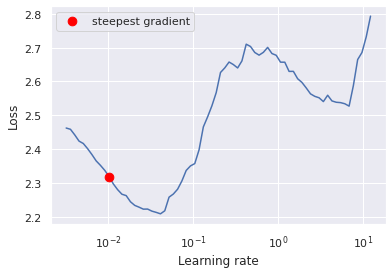

In [10]:
lr_finder = LRFinder(model, optimizer, criterion, device=device)
lr_finder.range_test(train, end_lr=100, num_iter=100)
my_plt,lr_val = lr_finder.plot() # to inspect the loss-learning rate graph
lr_finder.reset() # to reset the model and optimizer to their initial state

In [11]:
lr_val

0.010235310218990261

In [12]:
optimizer = optim.SGD(model.parameters(), lr=lr_val, momentum=0.9)
trainer = trainer.Trainer( model =model , optimizer =optimizer , device =device , train_loader = train, test_loader = test,epochs = 50,criteria = criterion,scheduler = scheduler)

In [13]:
(w,x),(y,z) = trainer.train()

  0%|          | 0/391 [00:00<?, ?it/s]

Epoch: 1


loss=1.0200873613357544 batch_id=390 Accuracy = 0.48198: 100%|██████████| 391/391 [01:17<00:00,  5.07it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0091, Accuracy: 6024/10000 (60.24%)

Epoch: 2


loss=0.7664417028427124 batch_id=390 Accuracy = 0.65984: 100%|██████████| 391/391 [01:18<00:00,  5.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0080, Accuracy: 6612/10000 (66.12%)

Epoch: 3


loss=0.7652972340583801 batch_id=390 Accuracy = 0.7371: 100%|██████████| 391/391 [01:18<00:00,  5.01it/s]
loss=0.7377174496650696 batch_id=0 Accuracy = 0.00196:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0061, Accuracy: 7349/10000 (73.49%)

Epoch: 4


loss=0.6558492183685303 batch_id=390 Accuracy = 0.774: 100%|██████████| 391/391 [01:18<00:00,  5.01it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0047, Accuracy: 7986/10000 (79.86%)

Epoch: 5


loss=0.6578541994094849 batch_id=390 Accuracy = 0.80336: 100%|██████████| 391/391 [01:18<00:00,  4.99it/s]
loss=0.584166944026947 batch_id=0 Accuracy = 0.00202:   0%|          | 1/391 [00:00<01:16,  5.07it/s]


Test set: Average loss: 0.0051, Accuracy: 7807/10000 (78.07%)

Epoch: 6


loss=0.3888137638568878 batch_id=390 Accuracy = 0.82206: 100%|██████████| 391/391 [01:18<00:00,  4.99it/s]
loss=0.3449198007583618 batch_id=0 Accuracy = 0.0023:   0%|          | 1/391 [00:00<01:16,  5.10it/s]


Test set: Average loss: 0.0045, Accuracy: 8000/10000 (80.00%)

Epoch: 7


loss=0.5351983308792114 batch_id=390 Accuracy = 0.83738: 100%|██████████| 391/391 [01:17<00:00,  5.04it/s]
loss=0.38550207018852234 batch_id=0 Accuracy = 0.00228:   0%|          | 1/391 [00:00<01:15,  5.16it/s]


Test set: Average loss: 0.0041, Accuracy: 8233/10000 (82.33%)

Epoch: 8


loss=0.5715652704238892 batch_id=390 Accuracy = 0.84926: 100%|██████████| 391/391 [01:17<00:00,  5.03it/s]
loss=0.4397921562194824 batch_id=0 Accuracy = 0.00218:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0040, Accuracy: 8369/10000 (83.69%)

Epoch: 9


loss=0.5009819269180298 batch_id=390 Accuracy = 0.8589: 100%|██████████| 391/391 [01:17<00:00,  5.05it/s]
loss=0.3422318994998932 batch_id=0 Accuracy = 0.00228:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0042, Accuracy: 8222/10000 (82.22%)

Epoch: 10


loss=0.3654603362083435 batch_id=390 Accuracy = 0.86988: 100%|██████████| 391/391 [01:17<00:00,  5.02it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 8679/10000 (86.79%)

Epoch: 11


loss=0.19356784224510193 batch_id=390 Accuracy = 0.87982: 100%|██████████| 391/391 [01:17<00:00,  5.02it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0034, Accuracy: 8572/10000 (85.72%)

Epoch: 12


loss=0.21147866547107697 batch_id=390 Accuracy = 0.88642: 100%|██████████| 391/391 [01:17<00:00,  5.05it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0033, Accuracy: 8620/10000 (86.20%)

Epoch: 13


loss=0.2734794616699219 batch_id=390 Accuracy = 0.89344: 100%|██████████| 391/391 [01:18<00:00,  5.01it/s]
loss=0.30799180269241333 batch_id=0 Accuracy = 0.00234:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8790/10000 (87.90%)

Epoch: 14


loss=0.21197471022605896 batch_id=390 Accuracy = 0.89878: 100%|██████████| 391/391 [01:18<00:00,  5.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 8744/10000 (87.44%)

Epoch: 15


loss=0.20152156054973602 batch_id=390 Accuracy = 0.90416: 100%|██████████| 391/391 [01:18<00:00,  5.00it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8838/10000 (88.38%)

Epoch: 16


loss=0.4504867494106293 batch_id=390 Accuracy = 0.90864: 100%|██████████| 391/391 [01:17<00:00,  5.03it/s]
loss=0.24883417785167694 batch_id=0 Accuracy = 0.00236:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0033, Accuracy: 8652/10000 (86.52%)

Epoch: 17


loss=0.32808756828308105 batch_id=390 Accuracy = 0.91248: 100%|██████████| 391/391 [01:17<00:00,  5.06it/s]
loss=0.20011410117149353 batch_id=0 Accuracy = 0.00234:   0%|          | 1/391 [00:00<01:15,  5.16it/s]


Test set: Average loss: 0.0032, Accuracy: 8706/10000 (87.06%)

Epoch: 18


loss=0.30634161829948425 batch_id=390 Accuracy = 0.91988: 100%|██████████| 391/391 [01:17<00:00,  5.07it/s]
loss=0.2497767210006714 batch_id=0 Accuracy = 0.0024:   0%|          | 1/391 [00:00<01:16,  5.13it/s]


Test set: Average loss: 0.0028, Accuracy: 8858/10000 (88.58%)

Epoch: 19


loss=0.14456072449684143 batch_id=390 Accuracy = 0.92302: 100%|██████████| 391/391 [01:17<00:00,  5.07it/s]
loss=0.17436616122722626 batch_id=0 Accuracy = 0.00242:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 8869/10000 (88.69%)

Epoch: 20


loss=0.23177842795848846 batch_id=390 Accuracy = 0.92638: 100%|██████████| 391/391 [01:17<00:00,  5.07it/s]
loss=0.2772781252861023 batch_id=0 Accuracy = 0.00232:   0%|          | 1/391 [00:00<01:16,  5.12it/s]


Test set: Average loss: 0.0028, Accuracy: 8897/10000 (88.97%)

Epoch: 21


loss=0.16521671414375305 batch_id=390 Accuracy = 0.92808: 100%|██████████| 391/391 [01:17<00:00,  5.07it/s]
loss=0.2708287835121155 batch_id=0 Accuracy = 0.00234:   0%|          | 1/391 [00:00<01:15,  5.19it/s]


Test set: Average loss: 0.0028, Accuracy: 8905/10000 (89.05%)

Epoch: 22


loss=0.24370324611663818 batch_id=390 Accuracy = 0.93244: 100%|██████████| 391/391 [01:17<00:00,  5.04it/s]
loss=0.2160644382238388 batch_id=0 Accuracy = 0.00238:   0%|          | 1/391 [00:00<01:16,  5.07it/s]


Test set: Average loss: 0.0028, Accuracy: 8913/10000 (89.13%)

Epoch: 23


loss=0.20118987560272217 batch_id=390 Accuracy = 0.93694: 100%|██████████| 391/391 [01:17<00:00,  5.03it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0035, Accuracy: 8748/10000 (87.48%)

Epoch: 24


loss=0.0995507687330246 batch_id=390 Accuracy = 0.9384: 100%|██████████| 391/391 [01:17<00:00,  5.05it/s]
loss=0.2037273496389389 batch_id=0 Accuracy = 0.0024:   0%|          | 1/391 [00:00<01:16,  5.12it/s]


Test set: Average loss: 0.0027, Accuracy: 8966/10000 (89.66%)

Epoch: 25


loss=0.39629095792770386 batch_id=390 Accuracy = 0.94118: 100%|██████████| 391/391 [01:17<00:00,  5.07it/s]
loss=0.22328759729862213 batch_id=0 Accuracy = 0.00238:   0%|          | 1/391 [00:00<01:15,  5.16it/s]


Test set: Average loss: 0.0029, Accuracy: 8938/10000 (89.38%)

Epoch: 26


loss=0.2481185495853424 batch_id=390 Accuracy = 0.94394: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s]
loss=0.1384820193052292 batch_id=0 Accuracy = 0.00244:   0%|          | 1/391 [00:00<01:15,  5.18it/s]


Test set: Average loss: 0.0033, Accuracy: 8794/10000 (87.94%)

Epoch: 27


loss=0.23392310738563538 batch_id=390 Accuracy = 0.9456: 100%|██████████| 391/391 [01:16<00:00,  5.09it/s]
loss=0.09723390638828278 batch_id=0 Accuracy = 0.0025:   0%|          | 1/391 [00:00<01:16,  5.11it/s]


Test set: Average loss: 0.0027, Accuracy: 8965/10000 (89.65%)

Epoch: 28


loss=0.28234297037124634 batch_id=390 Accuracy = 0.94774: 100%|██████████| 391/391 [01:16<00:00,  5.09it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 8971/10000 (89.71%)

Epoch: 29


loss=0.1260906457901001 batch_id=390 Accuracy = 0.9508: 100%|██████████| 391/391 [01:16<00:00,  5.10it/s]
loss=0.09046652168035507 batch_id=0 Accuracy = 0.0025:   0%|          | 1/391 [00:00<01:15,  5.16it/s]


Test set: Average loss: 0.0028, Accuracy: 8980/10000 (89.80%)

Epoch: 30


loss=0.14406871795654297 batch_id=390 Accuracy = 0.94962: 100%|██████████| 391/391 [01:16<00:00,  5.10it/s]
loss=0.15487472712993622 batch_id=0 Accuracy = 0.0024:   0%|          | 1/391 [00:00<01:14,  5.22it/s]


Test set: Average loss: 0.0030, Accuracy: 8929/10000 (89.29%)

Epoch: 31


loss=0.09743517637252808 batch_id=390 Accuracy = 0.9523: 100%|██████████| 391/391 [01:16<00:00,  5.09it/s]
loss=0.07346884161233902 batch_id=0 Accuracy = 0.0025:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 9001/10000 (90.01%)

Epoch: 32


loss=0.13402435183525085 batch_id=390 Accuracy = 0.95534: 100%|██████████| 391/391 [01:17<00:00,  5.06it/s]
loss=0.07446678727865219 batch_id=0 Accuracy = 0.0025:   0%|          | 1/391 [00:00<01:15,  5.18it/s]


Test set: Average loss: 0.0029, Accuracy: 8984/10000 (89.84%)

Epoch: 33


loss=0.14556439220905304 batch_id=390 Accuracy = 0.95638: 100%|██████████| 391/391 [01:17<00:00,  5.05it/s]
loss=0.10178089886903763 batch_id=0 Accuracy = 0.00246:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 9054/10000 (90.54%)

Epoch: 34


loss=0.14798767864704132 batch_id=390 Accuracy = 0.95672: 100%|██████████| 391/391 [01:17<00:00,  5.06it/s]
loss=0.08056893944740295 batch_id=0 Accuracy = 0.0025:   0%|          | 1/391 [00:00<01:17,  5.01it/s]


Test set: Average loss: 0.0025, Accuracy: 9084/10000 (90.84%)

Epoch: 35


loss=0.08169620484113693 batch_id=390 Accuracy = 0.96152: 100%|██████████| 391/391 [01:16<00:00,  5.09it/s]
loss=0.05203351750969887 batch_id=0 Accuracy = 0.00252:   0%|          | 1/391 [00:00<01:16,  5.11it/s]


Test set: Average loss: 0.0028, Accuracy: 9048/10000 (90.48%)

Epoch: 36


loss=0.049976546317338943 batch_id=390 Accuracy = 0.96288: 100%|██████████| 391/391 [01:16<00:00,  5.10it/s]
loss=0.07489518076181412 batch_id=0 Accuracy = 0.00248:   0%|          | 1/391 [00:00<01:16,  5.13it/s]


Test set: Average loss: 0.0029, Accuracy: 9039/10000 (90.39%)

Epoch: 37


loss=0.1726394146680832 batch_id=390 Accuracy = 0.96142: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s]
loss=0.11142350733280182 batch_id=0 Accuracy = 0.00246:   0%|          | 1/391 [00:00<01:15,  5.16it/s]


Test set: Average loss: 0.0025, Accuracy: 9135/10000 (91.35%)

Epoch: 38


loss=0.10234852135181427 batch_id=390 Accuracy = 0.96538: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s]
loss=0.055224984884262085 batch_id=0 Accuracy = 0.0025:   0%|          | 1/391 [00:00<01:16,  5.13it/s]


Test set: Average loss: 0.0027, Accuracy: 9073/10000 (90.73%)

Epoch: 39


loss=0.1483260840177536 batch_id=390 Accuracy = 0.96636: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s]
loss=0.13349297642707825 batch_id=0 Accuracy = 0.00246:   0%|          | 1/391 [00:00<01:15,  5.17it/s]


Test set: Average loss: 0.0026, Accuracy: 9122/10000 (91.22%)

Epoch: 40


loss=0.1078343614935875 batch_id=390 Accuracy = 0.9665: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s]
loss=0.3351636230945587 batch_id=0 Accuracy = 0.00234:   0%|          | 1/391 [00:00<01:16,  5.09it/s]


Test set: Average loss: 0.0026, Accuracy: 9116/10000 (91.16%)

Epoch: 41


loss=0.04186471551656723 batch_id=390 Accuracy = 0.96576: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s]
loss=0.07389412820339203 batch_id=0 Accuracy = 0.00244:   0%|          | 1/391 [00:00<01:14,  5.24it/s]


Test set: Average loss: 0.0026, Accuracy: 9147/10000 (91.47%)

Epoch: 42


loss=0.09062008559703827 batch_id=390 Accuracy = 0.96992: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s]
  0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 9096/10000 (90.96%)

Epoch: 43


loss=0.025336766615509987 batch_id=390 Accuracy = 0.96782: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s]
loss=0.06181853264570236 batch_id=0 Accuracy = 0.00252:   0%|          | 1/391 [00:00<01:15,  5.18it/s]


Test set: Average loss: 0.0029, Accuracy: 9058/10000 (90.58%)

Epoch: 44


loss=0.0816609263420105 batch_id=390 Accuracy = 0.96956: 100%|██████████| 391/391 [01:16<00:00,  5.10it/s]
loss=0.06526985764503479 batch_id=0 Accuracy = 0.00248:   0%|          | 1/391 [00:00<01:16,  5.13it/s]


Test set: Average loss: 0.0027, Accuracy: 9128/10000 (91.28%)

Epoch: 45


loss=0.08014456182718277 batch_id=390 Accuracy = 0.97244: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s]
loss=0.04523550346493721 batch_id=0 Accuracy = 0.00252:   0%|          | 1/391 [00:00<01:15,  5.14it/s]


Test set: Average loss: 0.0027, Accuracy: 9164/10000 (91.64%)

Epoch: 46


loss=0.049075301736593246 batch_id=390 Accuracy = 0.97018: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s]
loss=0.05638004466891289 batch_id=0 Accuracy = 0.00252:   0%|          | 1/391 [00:00<01:16,  5.12it/s]


Test set: Average loss: 0.0027, Accuracy: 9149/10000 (91.49%)

Epoch: 47


loss=0.10151629149913788 batch_id=390 Accuracy = 0.97362: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s]
loss=0.08218513429164886 batch_id=0 Accuracy = 0.0025:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0027, Accuracy: 9131/10000 (91.31%)

Epoch: 48


loss=0.024852296337485313 batch_id=390 Accuracy = 0.9737: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s]
loss=0.07385750114917755 batch_id=0 Accuracy = 0.00248:   0%|          | 1/391 [00:00<01:16,  5.08it/s]


Test set: Average loss: 0.0026, Accuracy: 9175/10000 (91.75%)

Epoch: 49


loss=0.07124404609203339 batch_id=390 Accuracy = 0.97286: 100%|██████████| 391/391 [01:16<00:00,  5.08it/s]
loss=0.06604436039924622 batch_id=0 Accuracy = 0.0025:   0%|          | 0/391 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 9166/10000 (91.66%)

Epoch: 50


loss=0.043768201023340225 batch_id=390 Accuracy = 0.97494: 100%|██████████| 391/391 [01:16<00:00,  5.10it/s]



Test set: Average loss: 0.0029, Accuracy: 9144/10000 (91.44%)



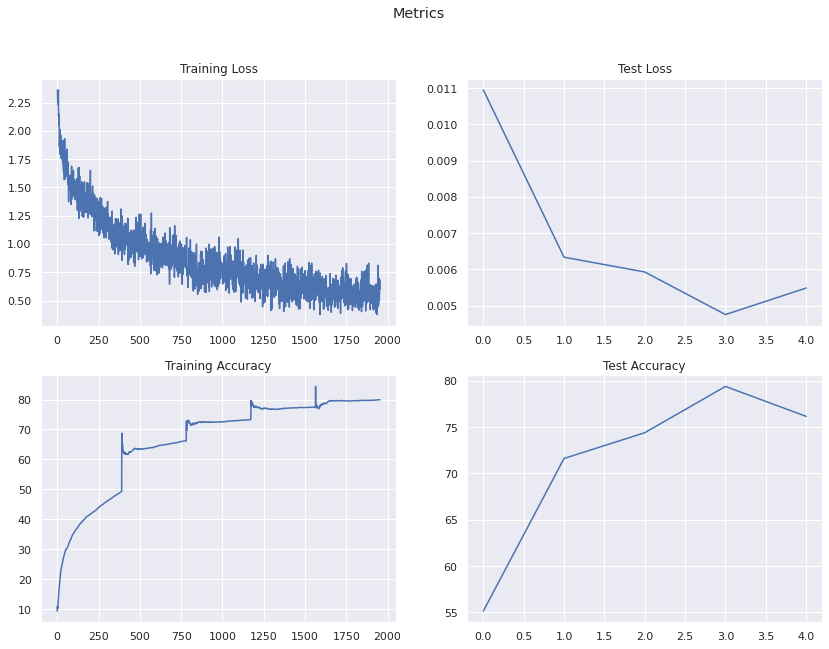

In [14]:
plot_metrics(w,y,x,z)

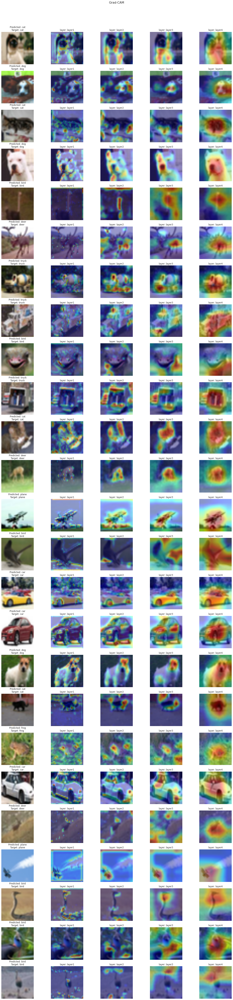

In [15]:
target_layers = ["layer1", "layer2", "layer3", "layer4"]
gcam_layers, predicted_probs, predicted_classes,data,target = load_gradcam(test, model, device, target_layers)
mns_obj = data_augmentation.Dataset_Mean_and_std()
mean,std = mns_obj.mean_and_std('cifar10')
denorm = DeNorm(mean=mean, std=std)
plot_gradcam(gcam_layers, data, target, predicted_classes,classes, denorm)

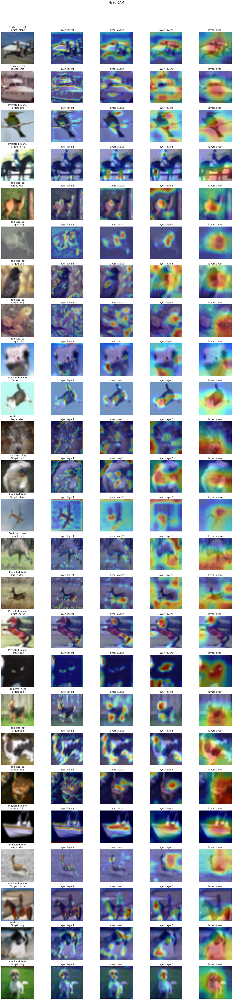

In [16]:
gcam_layers, predicted_probs, predicted_classes,data,target = load_gradcam(test, model, device, target_layers,classified = False)
plot_gradcam(gcam_layers, data, target, predicted_classes,classes, denorm)